In [336]:
import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix
import math
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import scipy.stats as stats
import scipy.stats as scs
from matplotlib.colors import ListedColormap
import itertools

%matplotlib inline
plt.style.use('ggplot')

from sklearn import neighbors, datasets
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, precision_score, recall_score
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.base import clone
from sklearn.base import BaseEstimator, TransformerMixin

from sklearn import datasets
from sklearn.datasets import make_classification
from sklearn.datasets import load_boston
from sklearn.datasets import load_diabetes
pd.options.mode.chained_assignment = None
from utils import XyScaler # .py file given with assignment
from src.roc_curve import *   # file given with assignment


Machine Learning: automated process to discover a relationship between known inputs and known outputs, so that (reasonably) accurate predictions can be made for unknown inputs.    

Key Assumptions:     
1.there is a relationship between the inputs and outputs.   
2.the relationship can be discovered by a computer.    
3.relationship will contiunue to hold for the immediate future.    
4.the most significant features are represented in the data.    
5.the relevant features can be quantified or classified.     


labels/targets: columns of the dataset
examples using houses Bedrooms, Bathrooms, Square Feet (these are also X) - Matrix     
Sales price (this is the y) - this is a vector      
             
Two types of supervised learning             
Regression -  target is a number, Ex. sales price of a house, number of visitors to a museum, inches of snow in december, gas mileage of a car      

Classification - target is a category, Ex. an email is or is not spam, paining was Picasso or Van Gogh, House will sell or not sale by a date, a person will vote Republican, Democrat, Libertarian, or Green       

Linear   
    individual features contribute to the outcome according to fixed        equations
Non-linear    
    feature importance may vary under different conditions
    feature effects may change from positive to negative
    ex. house price vs proximity to public transportatio


MSE = mean square error

RMSD = root-mean square error (sqrt(MSE))        
RSS = residual sum of squares (sum of the  squared difference between actual and  predicted values)

TSS =  total sum of squares (sum of squared differences between observations and their overall mean)


Decision Boundary -   

Threshold-     



Remember:     
L1 = Manhattan Distance = sum(np.abs(vec1 - vec2))
        
L2 = Euclidian Distance = np.sqrt(sum((vec1 - vec2)**2))






## KNN

Implement KNN algorithm     
Training Algorithm:      
1.store all the data

Prediction Algorithm (predict the value of a new point x): 
2.calculate the distance from x to all points in dataset
3.sort the points in your dataset by increasing distance  x.
4.predict the majority label of the k closest points

Explain the difference between KNN for regression vs. classification:

    regression predicts the average label amongst k closest neighbors (mean) 

    classification predicts the most common label amongst its k closest neighbors      
    
Understand KNN hyperparameters
a parameter whose value is used to control the learning process
i.e. distance metric and k     
      
How does changing them affect the model?
high k can lead to underfitting       
low k can lead to overfitting      

Describe the curse of dimensionality   
with high dimensions the nearest neighbors can be very far away    
       
remedies - get more data, get more varied data, reduce number of dimensions,reduce relative importance of csome data features, standardize data. 

When dealing with models that measure distance it is important to scale the data so that it is in the same format. 

Pros: super simple, training is trivial, works with any number classes, easy to add more data, few hyperparameters  
          
Cons: high prediction cost(especially large datasets), bad with high dimensions, categorical features don't work well   
   
Works best for dimensions < 5


### KNN Example


In [326]:
d = {'mpg':[18. , 15. , 18. , 16. , 17. , 15. , 14. , 14. , 14. , 15. , 15. ,14. , 15. , 14. , 24. , 22. , 18. , 21. , 27. , 26. , 25. , 24. ,25. , 26. , 21. , 10. , 10. , 11. ,  9. , 27. , 28. , 25. , 19. ,16. , 17. , 19. , 18. , 14. , 14. , 14. , 14. , 12. , 13. , 13. ,18. , 22. , 19. , 18. , 23. , 28. , 30. , 30. , 31. , 35. , 27. ,26. , 24. , 25. , 23. , 20. , 21. , 13. , 14. , 15. , 14. , 17. ,11. , 13. , 12. , 13. , 19. , 15. , 13. , 13. , 14. , 18. , 22. ,21. , 26. , 22. , 28. , 23. , 28. , 27. , 13. , 14. , 13. , 14. ,15. , 12. , 13. , 13. , 14. , 13. , 12. , 13. , 18. , 16. , 18. ,18. , 23. , 26. , 11. , 12. , 13. , 12. , 18. , 20. , 21. , 22. ,18. , 19. , 21. , 26. , 15. , 16. , 29. , 24. , 20. , 19. , 15. ,24. , 20. , 11. , 20. , 19. , 15. , 31. , 26. , 32. , 25. , 16. ,16. , 18. , 16. , 13. , 14. , 14. , 14. , 29. , 26. , 26. , 31. ,32. , 28. , 24. , 26. , 24. , 26. , 31. , 19. , 18. , 15. , 15. ,16. , 15. , 16. , 14. , 17. , 16. , 15. , 18. , 21. , 20. , 13. ,29. , 23. , 20. , 23. , 24. , 25. , 24. , 18. , 29. , 19. , 23. ,23. , 22. , 25. , 33. , 28. , 25. , 25. , 26. , 27. , 17.5, 16. ,15.5, 14.5, 22. , 22. , 24. , 22.5, 29. , 24.5, 29. , 33. , 20. ,18. , 18.5, 17.5, 29.5, 32. , 28. , 26.5, 20. , 13. , 19. , 19. ,16.5, 16.5, 13. , 13. , 13. , 31.5, 30. , 36. , 25.5, 33.5, 17.5,17. , 15.5, 15. , 17.5, 20.5, 19. , 18.5, 16. , 15.5, 15.5, 16. ,29. , 24.5, 26. , 25.5, 30.5, 33.5, 30. , 30.5, 22. , 21.5, 21.5,43.1, 36.1, 32.8, 39.4, 36.1, 19.9, 19.4, 20.2, 19.2, 20.5, 20.2,25.1, 20.5, 19.4, 20.6, 20.8, 18.6, 18.1, 19.2, 17.7, 18.1, 17.5,30. , 27.5, 27.2, 30.9, 21.1, 23.2, 23.8, 23.9, 20.3, 17. , 21.6,16.2, 31.5, 29.5, 21.5, 19.8, 22.3, 20.2, 20.6, 17. , 17.6, 16.5,18.2, 16.9, 15.5, 19.2, 18.5, 31.9, 34.1, 35.7, 27.4, 25.4, 23. ,27.2, 23.9, 34.2, 34.5, 31.8, 37.3, 28.4, 28.8, 26.8, 33.5, 41.5,38.1, 32.1, 37.2, 28. , 26.4, 24.3, 19.1, 34.3, 29.8, 31.3, 37. ,32.2, 46.6, 27.9, 40.8, 44.3, 43.4, 36.4, 30. , 44.6, 33.8, 29.8,32.7, 23.7, 35. , 32.4, 27.2, 26.6, 25.8, 23.5, 30. , 39.1, 39. ,35.1, 32.3, 37. , 37.7, 34.1, 34.7, 34.4, 29.9, 33. , 33.7, 32.4,32.9, 31.6, 28.1, 30.7, 25.4, 24.2, 22.4, 26.6, 20.2, 17.6, 28. ,27. , 34. , 31. , 29. , 27. , 24. , 36. , 37. , 31. , 38. , 36. ,36. , 36. , 34. , 38. , 32. , 38. , 25. , 38. , 26. , 22. , 32. ,36. , 27. , 27. , 44. , 32. , 28. , 31. ],
    'horsepower':[130., 165., 150., 150., 140., 198., 220., 215., 225., 190., 170.,160., 150., 225.,  95.,  95.,  97.,  85.,  88.,  46.,  87.,  90., 95., 113.,  90., 215., 200., 210., 193.,  88.,  90.,  95., 100.,105., 100.,  88., 100., 165., 175., 153., 150., 180., 170., 175.,110.,  72., 100.,  88.,  86.,  90.,  70.,  76.,  65.,  69.,  60., 70.,  95.,  80.,  54.,  90.,  86., 165., 175., 150., 153., 150.,208., 155., 160., 190.,  97., 150., 130., 140., 150., 112.,  76., 87.,  69.,  86.,  92.,  97.,  80.,  88., 175., 150., 145., 137.,150., 198., 150., 158., 150., 215., 225., 175., 105., 100., 100., 88.,  95.,  46., 150., 167., 170., 180., 100.,  88.,  72.,  94., 90.,  85., 107.,  90., 145., 230.,  49.,  75.,  91., 112., 150.,110., 122., 180.,  95., 100., 100.,  67.,  80.,  65.,  75., 100.,110., 105., 140., 150., 150., 140., 150.,  83.,  67.,  78.,  52., 61.,  75.,  75.,  75.,  97.,  93.,  67.,  95., 105.,  72.,  72.,170., 145., 150., 148., 110., 105., 110.,  95., 110., 110., 129., 75.,  83., 100.,  78.,  96.,  71.,  97.,  97.,  70.,  90.,  95., 88.,  98., 115.,  53.,  86.,  81.,  92.,  79.,  83., 140., 150.,120., 152., 100., 105.,  81.,  90.,  52.,  60.,  70.,  53., 100., 78., 110.,  95.,  71.,  70.,  75.,  72., 102., 150.,  88., 108.,120., 180., 145., 130., 150.,  68.,  80.,  58.,  96.,  70., 145.,110., 145., 130., 110., 105., 100.,  98., 180., 170., 190., 149., 78.,  88.,  75.,  89.,  63.,  83.,  67.,  78.,  97., 110., 110., 48.,  66.,  52.,  70.,  60., 110., 140., 139., 105.,  95.,  85., 88., 100.,  90., 105.,  85., 110., 120., 145., 165., 139., 140., 68.,  95.,  97.,  75.,  95., 105.,  85.,  97., 103., 125., 115.,133.,  71.,  68., 115.,  85.,  88.,  90., 110., 130., 129., 138.,135., 155., 142., 125., 150.,  71.,  65.,  80.,  80.,  77., 125., 71.,  90.,  70.,  70.,  65.,  69.,  90., 115., 115.,  90.,  76., 60.,  70.,  65.,  90.,  88.,  90.,  90.,  78.,  90.,  75.,  92., 75.,  65., 105.,  65.,  48.,  48.,  67.,  67.,  67.,  67.,  62.,132., 100.,  88.,  72.,  84.,  84.,  92., 110.,  84.,  58.,  64., 60.,  67.,  65.,  62.,  68.,  63.,  65.,  65.,  74.,  75.,  75.,100.,  74.,  80.,  76., 116., 120., 110., 105.,  88.,  85.,  88., 88.,  88.,  85.,  84.,  90.,  92.,  74.,  68.,  68.,  63.,  70., 88.,  75.,  70.,  67.,  67.,  67., 110.,  85.,  92., 112.,  96., 84.,  90.,  86.,  52.,  84.,  79.,  82.], 'weight':[3504., 3693., 3436., 3433., 3449., 4341., 4354., 4312., 4425.,3850., 3563., 3609., 3761., 3086., 2372., 2833., 2774., 2587.,2130., 1835., 2672., 2430., 2375., 2234., 2648., 4615., 4376.,4382., 4732., 2130., 2264., 2228., 2634., 3439., 3329., 3302.,3288., 4209., 4464., 4154., 4096., 4955., 4746., 5140., 2962.,2408., 3282., 3139., 2220., 2123., 2074., 2065., 1773., 1613.,1834., 1955., 2278., 2126., 2254., 2408., 2226., 4274., 4385.,4135., 4129., 3672., 4633., 4502., 4456., 4422., 2330., 3892.,4098., 4294., 4077., 2933., 2511., 2979., 2189., 2395., 2288.,2506., 2164., 2100., 4100., 3672., 3988., 4042., 3777., 4952.,4464., 4363., 4237., 4735., 4951., 3821., 3121., 3278., 2945.,3021., 2904., 1950., 4997., 4906., 4654., 4499., 2789., 2279.,2401., 2379., 2124., 2310., 2472., 2265., 4082., 4278., 1867.,2158., 2582., 2868., 3399., 2660., 2807., 3664., 3102., 2901.,3336., 1950., 2451., 1836., 2542., 3781., 3632., 3613., 4141.,4699., 4457., 4638., 4257., 2219., 1963., 2300., 1649., 2003.,2125., 2108., 2246., 2489., 2391., 2000., 3264., 3459., 3432.,3158., 4668., 4440., 4498., 4657., 3907., 3897., 3730., 3785.,3039., 3221., 3169., 2171., 2639., 2914., 2592., 2702., 2223.,2545., 2984., 1937., 3211., 2694., 2957., 2945., 2671., 1795.,2464., 2220., 2572., 2255., 2202., 4215., 4190., 3962., 4215.,3233., 3353., 3012., 3085., 2035., 2164., 1937., 1795., 3651.,3574., 3645., 3193., 1825., 1990., 2155., 2565., 3150., 3940.,3270., 2930., 3820., 4380., 4055., 3870., 3755., 2045., 2155.,1825., 2300., 1945., 3880., 4060., 4140., 4295., 3520., 3425.,3630., 3525., 4220., 4165., 4325., 4335., 1940., 2740., 2265.,2755., 2051., 2075., 1985., 2190., 2815., 2600., 2720., 1985.,1800., 1985., 2070., 1800., 3365., 3735., 3570., 3535., 3155.,2965., 2720., 3430., 3210., 3380., 3070., 3620., 3410., 3425.,3445., 3205., 4080., 2155., 2560., 2300., 2230., 2515., 2745.,2855., 2405., 2830., 3140., 2795., 3410., 1990., 2135., 3245.,2990., 2890., 3265., 3360., 3840., 3725., 3955., 3830., 4360.,4054., 3605., 3940., 1925., 1975., 1915., 2670., 3530., 3900.,3190., 3420., 2200., 2150., 2020., 2130., 2670., 2595., 2700.,2556., 2144., 1968., 2120., 2019., 2678., 2870., 3003., 3381.,2188., 2711., 2542., 2434., 2265., 2110., 2800., 2110., 2085.,2335., 2950., 3250., 1850., 2145., 1845., 2910., 2420., 2500.,2290., 2490., 2635., 2620., 2725., 2385., 1755., 1875., 1760.,2065., 1975., 2050., 1985., 2215., 2045., 2380., 2190., 2210.,2350., 2615., 2635., 3230., 3160., 2900., 2930., 3415., 3725.,3060., 3465., 2605., 2640., 2395., 2575., 2525., 2735., 2865.,1980., 2025., 1970., 2125., 2125., 2160., 2205., 2245., 1965.,1965., 1995., 2945., 3015., 2585., 2835., 2665., 2370., 2950.,2790., 2130., 2295., 2625., 2720.]}


In [327]:
cars = pd.DataFrame(d)
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392 entries, 0 to 391
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   mpg         392 non-null    float64
 1   horsepower  392 non-null    float64
 2   weight      392 non-null    float64
dtypes: float64(3)
memory usage: 9.3 KB


Text(0.5, 1.0, 'Car Horsepower Vs MPG')

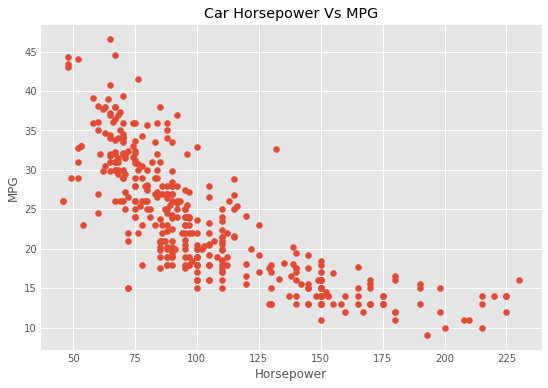

In [328]:
# predict MPG given horsepower

X = cars.horsepower.values
y = cars.mpg.values

fig, ax = plt.subplots(figsize=(8,6))
ax.scatter(X,y)
ax.set_xlabel('Horsepower')
ax.set_ylabel('MPG')
ax.set_title('Car Horsepower Vs MPG')


(150, 1)


(150,)

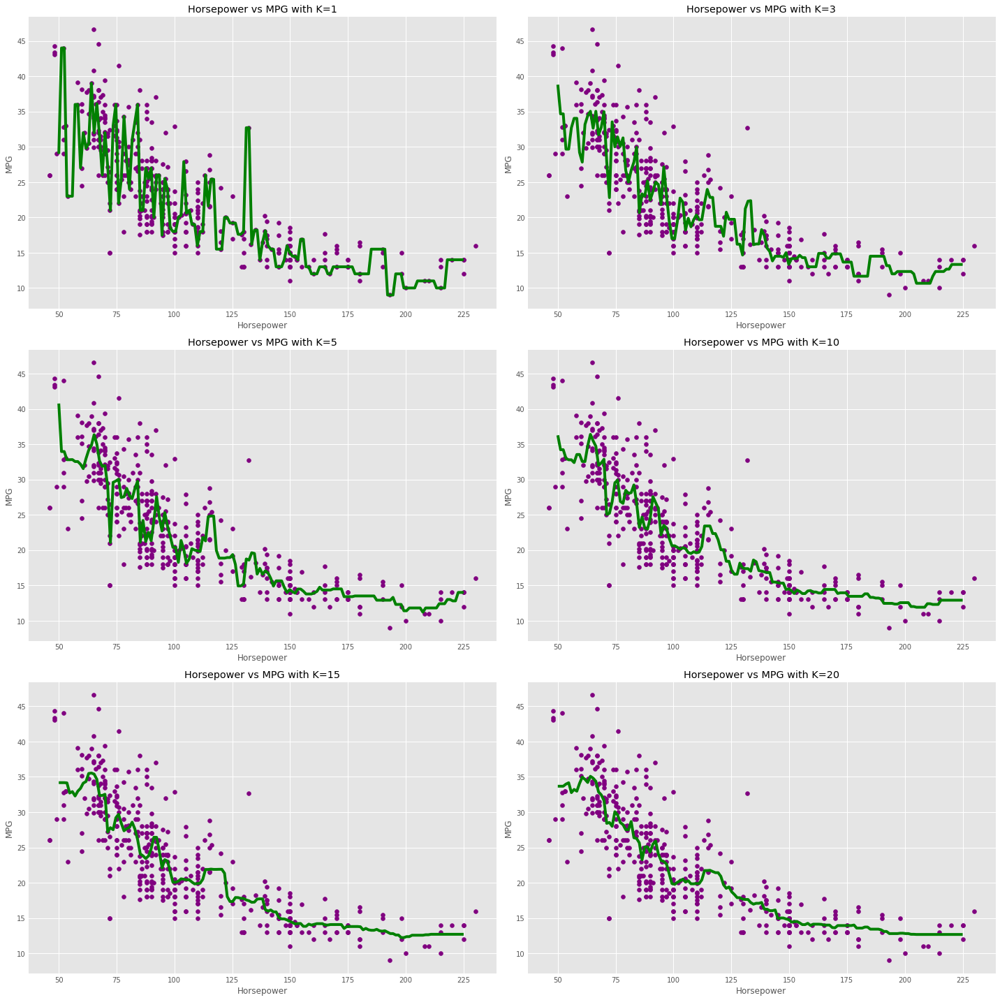

In [329]:
fig, axs = plt.subplots(3,2,figsize=(20,20))
x_tick = np.linspace(50, 225, 150)
k_num = [1,3,5,10,15,20]

results =  []
for k, ax in zip(k_num, axs.flatten()):
    model = KNeighborsRegressor(k)
    model.fit(X.reshape(-1,1), y.reshape(-1,1))
    results.append(model.predict(x_tick.reshape(-1,1)).mean())
    ax.scatter(X,y, color='purple')
    ax.plot(x_tick, model.predict(x_tick.reshape(-1,1)), linewidth=4, color='green')
    ax.set_xlabel('Horsepower')
    ax.set_ylabel('MPG')
    ax.set_title('Horsepower vs MPG with K={}'.format(k))
fig.tight_layout()
print(x_tick.reshape(-1,1).shape)
x_tick.shape


In [330]:
with a low k value the model fits closely to a given point, it can be overfit. As k increases, more points are included but too much and the model can be underfit. 

if we chose k = 5 and found the prediction was 34.24 mpg and the actual was 32 mpg, we measure the error using mean squared error or MSE. The error for a given point is the difference between observed value and predicted value. 



SyntaxError: invalid syntax (<ipython-input-330-a7f109aa740a>, line 1)

In [7]:
# choosing the k that's right for you.. or for the model

def predict_sample(X, y, k, seed):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state=seed)
    
    clf = make_pipeline(StandardScaler(), neighbors.KNeighborsRegressor(n_neighbors=k, weights='uniform'))
    clf.fit(X_train, y_train)
    
    return mean_squared_error(clf.predict(X_test), y_test)

In [44]:

X = cars[['weight','horsepower']].values
y = cars['mpg'].values

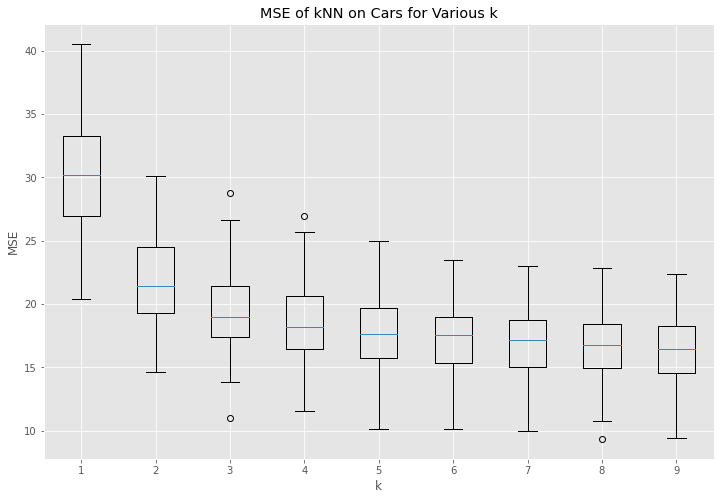

In [25]:
max_k = 10
step = 1
results = []
for k in range(1, max_k, step):
    kresults = []
    for seed in range(100):
        kresults.append(predict_sample(X, y, k, seed))
    results.append(kresults)
results = pd.DataFrame(results)
fig, ax = plt.subplots(figsize=(12, 8))

data = np.array(results.T)
ax.boxplot(data, labels=range(1, max_k, step))
ax.set_xlabel("k")
ax.set_ylabel("MSE")
ax.set_title("MSE of kNN on Cars for Various k")
plt.show()

In [ ]:
k of 5 above is lowest point where the slope evens out        

if the model measures distance remember to scale the data so it is in the same format. 

## Bias-Variance Trade Off

In [6]:
want to fit a curve to data so to predict new values with minimal error

zeroth order polynomial (mean),
 
line is more flexible as order increases and gets wiggly as order becomes very large. 
              
When order is low:    
errors are relatively large     
direction varies by region    
magnitude of errors varies

When order is increased:     
error decreases drastically     
still evidence of error by blocks
magnitude of errors is more normally distributed

More increases:
total error decreases and becomes more uniform and balanced


for a model to be useful it needs to not only fit known data, but be able to predict unknown data from the same distribution with lower error

●High Bias:      
    ○model is underfit     
    ○Line is too rigid     
    ○Not enough features      
    ○Errors tend towards one side or        the other in blocks    
    ○Error magnitude not randomly           distributed     
       

●High Variance:         
    ○Model is overfit         
    ○Line is too flexible        
    ○Too many features         
    ○Errors tend to alternate positive/     negative○Error magnitudes               normally distributed     
         
Conclusion:      
●Optimal model has minimum total error    
●Neither overfit nor underfit      
●It is necessary to do train-test split to observe error on unseen data     
●All else being equal, prefer simpler models to more complex   



SyntaxError: invalid syntax (<ipython-input-6-bb18afafaf0e>, line 1)

## Cross Validation

In [ ]:
Cross validation is a model validation technique for assessing how the results of a statustical analysis will generalize to an independant data set.  
         
Describe why cross validation is used:
1) attempting to quantify how well a model (of some given complexity) will predict an unseen data set    
2) tuning hyperparameters of models to get best predictions      
                 
Describe how to do it (especially k-fold cross validation)
1) Split your data (after splitting out hold-out set) into training/validation sets - commonly 70/30, 80/20, 90/10         
2) use training set to train several models of varying comlexity  e.g. linear regression, neural nets, decision trees, etc 

3) evaluate each model using validation set   
    calculate R**2, MSE, accuracy or whatever is best

4) keep the model that performs best over the validation set   

two types - single train-test split
and k-fold which involves running k amount of calculations    
    
Note:   
People use different terms for the splits    
All data -> Train, Test, Hold-out       
All data -> Train, Validate, Test      
All data -> Train, Validate, Hold-out       
All the same idea.          
        
What to do if overfitting:    
Get more data - get more data if possible     
keep only a suSubset selection - best of your predictors (columns)     
Regularization- restrict models parameter space     
Dimensionaliy Reduction - project data into a lower dimensional space   



●In the individual assignment, code it from scratch

●Aside: introduce feature selection/elimination

●Contrast cross validation with other statistical model comparison methods


### Cross Validation Example

In [45]:
# Our Data
boston = load_boston()
X = boston.data # features
y = boston.target # prices

In [46]:
# simple train test split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25)

In [47]:
def rmse(true, predicted): #true = y_test, predicted = x_test
    MSE = (np.square(true - predicted)).mean()
    return math.sqrt(MSE)

In [78]:
# Fit model with training data
reg = KNeighborsRegressor()
reg.fit(X_train, y_train)

#get predicted values for training and test data
train_predicted = reg.predict(X_train)
test_predicted = reg.predict(X_test)

# now lets get our RMSE for the datasets
print('RMSE for training set', rmse(y_train, train_predicted))
print('RMSE for test set', rmse(y_test, test_predicted))

RMSE for training set 5.2778369679903925
RMSE for test set 5.93255213235835


When we evaluate our RMSE on a new set of data, we gain an understanding of how well we are capturing the signal in our data. We can build more complex models that may bend to perfectly fit our training data. However, these models are not going to extend well to a new set of data, because they are likely overfit to our training data.

By evaluating our performance metric on a new set of data, we assure that we are modeling signal and not the noise in our data.

In [8]:
# now using K-fold CV
def cross_val(X_train, y_train, k):
 # remember the score is actually a loss (or error), so smaller is better. 
    kf = KFold(n_splits=k)
    error = np.empty(k)
    index=0
    for train, test in kf.split(X_train):
        reg = KNeighborsRegressor()
        reg.fit(X_train[train], y_train[train])
        pred = reg.predict(X_train[test])
        mse = mean_squared_error(pred, y_train[test])
        msel.append(mse)
        error[index] = rmse(pred, y_train[test])
        index+=1
    return np.mean(error)

cross_val(X_train, y_train, k=5)
6.655635493431437


NameError: name 'X_train' is not defined

In [113]:
# personal experiment - ignore

# cross_val(X_train, y_train, k=5)
# 6.655635493431437
# score = dict()
# score = []
# for k in range(2,100):
#     score.append(cross_val(X_train, y_train, k))
 
  

#     print (f'{k} k-folds = {score[-1]}')

## Linear Regression

In [ ]:
●Define 
supervised learning      
learning a function that maps an input to an output based on example input-output pairs (X,y --> predicting y based on values in X)

unsupervised learning   
a type of self organized learning that helps find previously unknown pattern in data set without pre-existing labels (X --> understanding structure in X)  

parametric algorithm     
fixed number of parameters     
makes assumption about the structure of the data    
works well if assumptions are correct   
Ex. linear regression, neural networks, statistical distribution defined by a finite set of parameters       
     
non-parametric algorithm    
uses a flexible number of parameters that grow in number as it learns from the data  makes fewer assumptions about the data     
Ex. K-nearest neighbors, decision trees           
      
●Define linear regression
betas - parameters/values/weights
      
given a dataset of n statistical units,a linear regression model assumes that the relationship between the dependent variable y and the p-vector of regressors x is linear        
     
attempts to model the relationship between two variables by fitting a linear equation to observed data.         

     
○Difference between simple and multiple linear regression
simple linear regression has only one predictor, multiple linear regression has more than one predictor   
       
●Interpret linear regression coefficients
the beta, parameter/coefficient - what we need to figure out from fitting the data 
(B = beta)
To interpret Bhat1  
Holding all else constant, a 1 unit increase in x1 increases the response yhat by Bhat1   
        
●Describe how coefficients in linear regression are determined  
mathematical optimization, use an objective function to maximize or minimize, in ML we typically talk about loss/cost functions. The goal is to find the parameters/coefficients/weights that minimize the cost/loss function     

●Assess the accuracy of the coefficients
The accuracy of the regression coefficients is measured by calculating the root mean square error (RMSE) of all coefficients at each realization. The RMSE is the square root of the mean of the squared deviations of the estimates from the true values.

RMSD and R**2 
Adjusted R squared adjusted to value from 0 to 1

●Assess the accuracy of a linear regression model

RSS = sum(y1 - yhat1)**2  residual sum of squares  = ok, but depends on n      

MSE = mean squared error - better but in squared units of response    

RMSD = Root mean square error(or deviation) - in units of response  *****

R**2 = TSS-RSS/TSS = 1- RSS/TSS - R squared, ranges from 0 to 1 (but doesnt penalize for model comlexity)   

Rbar**2 = adjusted R-squared (0 to 1), penalizes for model complexity according to number of predictors  ***** 

●Interpret an Ordinary Least Squares linear regression summary from Statsmodels
R- squared  = proportion of variance explained
F-statistic = measure of the significance of the fit 

see Linear_Regression_Intro.pdf for example




There were hypothesis tests checking if coefficients in the model were significant (not zero).  
     
The F-statistic is a hypothesis test where the Null Hypothesis is that all the coefficients are = 0 (so model is not useful).  
      
The alternative is that at least one of the coefficients is not 0.   
   
For no relationship between predictors and response (H0), F statistic is near 1. 


In [ ]:
RSS = sum(y1 - yhat1)**2  residual sum of squares  
MSE = mean squared error

In [ ]:
Linear regression is a useful statistical method we can use to understand the relationship between two variables, x and y. However, before we conduct linear regression, we must first make sure that four assumptions are met:

1. Linear relationship: There exists a linear relationship between the independent variable, x, and the dependent variable, y.

2. Independence: The residuals are independent. In particular, there is no correlation between consecutive residuals in time series data.

3. Homoscedasticity: The residuals have constant variance at every level of x.

4. Normality: The residuals of the model are normally distributed.

## Predictive/Inferential  Linear Regression

In [ ]:
●Understand the differences between predictive and inferential linear regression   
               
Predictive linear regression
goal - accurately predict a target; 
model picked by trying different features, using cross validation. 
We care that it predicts well on unseen data.  
Do not care that some features may be partially collinear, and therfore can't rely on our parameter estimates to tell us something about their effect on the signal. We may be violating some fundamental assumptions of inferential linear regression.     
     
Inferential linear regression     
goal - learn something accurate about the process that made the data. Infer(estimate) coefficients; 
model based on trying different features and checking residuals to see if we are violating some of the assumptions of linear regression. 
We care the estimates are accurate and valid.
Do not care that it predicts well (though it should)
    
Inferential linear regression is on the way to understanding causality, however, it doesn’t mean that we can deduce causality, only correlation or association. ********Correlation does not imply causation******
   
●Identify the assumptions of an inferential linear regression model 
1.Linearity: the relationship between the X and the y can be modeled linearly
2.Independence: the residuals should be independent from each other
3.Normality: the residuals are normally distributed
4.Homoscedasticity: the variance of the residuals is constant    
Note: you might see other assumptions mentioned if you do a quick Google search and we will briefly touch on one of the main ones:5.No multicollinearity: the independent variables are not highly correlated with each other
 
   
●Define and detect collinearity between features using VIF (Variance Inflation Factors)
In VIF method, we pick each feature and regress it against all of the other features. For each regression, the factor is calculated as :

VIF= 1/1-R**2

Where, R-squared is the coefficient of determination in linear regression. Its value lies between 0 and 1.

As we see from the formula, greater the value of R-squared, greater is the VIF. Hence, greater VIF denotes greater correlation. This is in agreement with the fact that a higher R-squared value denotes a stronger collinearity. Generally, a VIF above 5 indicates a high multicollinearity.     

●Understand what confounding is and how it can impact a model’s results  
A confounding variable is an “extra” variable that you didn’t account for. They can ruin an experiment and give you useless results. They can suggest there is correlation when in fact there isn’t and can introduce bias. 

●Encode categorical features to use in a regression model 
this is assigning beeleans to categorical features like male/female or yes/no. For multicategorical data, like choice of Asian/Caucasian/African American, create dummy  variables Asian = 1, Caucasian =0, drop African American.  
   
●Interpret the model output for a generalized audience    


### Linear Regression Example

In [40]:
# load some data (will need to import your own)
balance = pd.read_csv('/Users/scottsturtz/DSI/School_Work/Assignments/predictive-linear-regression/data/balance.csv', index_col=0)
b = balance.copy()
b.head(3)

,Income,Limit,Rating,Cards,Age,Education,Gender,Student,Married,Ethnicity,Balance
1,14.891,3606,283,2,34,11,Male,No,Yes,Caucasian,333
2,106.025,6645,483,3,82,15,Female,Yes,Yes,Asian,903
3,104.593,7075,514,4,71,11,Male,No,No,Asian,580


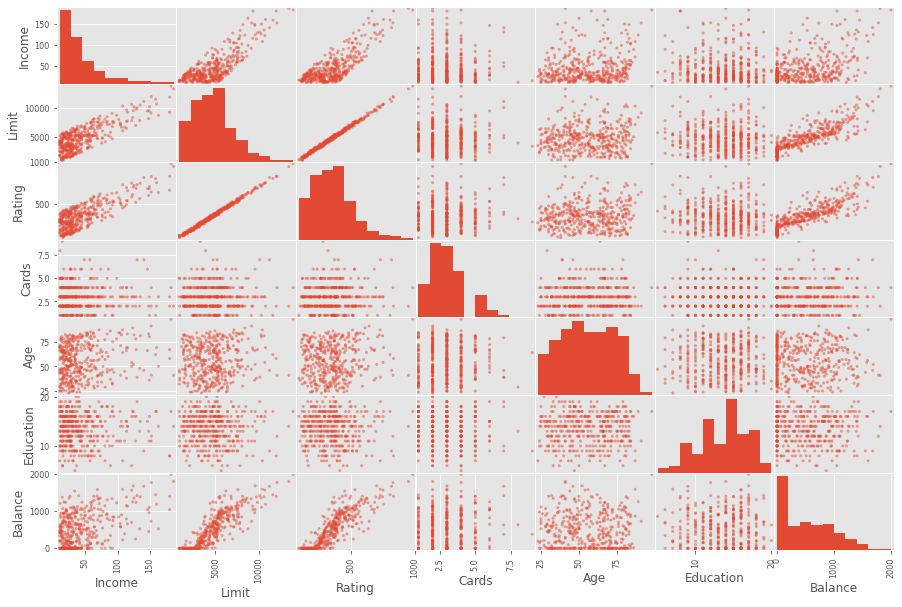

In [41]:
# look at distributions through scatter matrix
pd.plotting.scatter_matrix(b, figsize=(15,10))
plt.show()

In [179]:
# Balance is strongly correlated to the Rating and Limit and somewhat related to Income.


In [42]:
#Need to set booleans for categorical data like Maried, Gender and Student
b['Gender'].replace({'Female': 0, ' Male': 1}, inplace=True)
b['Married'].replace({'No':0, 'Yes': 1}, inplace=True)
b['Student'] = b['Student'].map({'No':0, 'Yes': 1})


In [43]:
# Get the Dummy variables
ethnicity_dummy = pd.get_dummies(b['Ethnicity'])
# Only need two of the three values
b[ ['Asian', 'Caucasian'] ] = ethnicity_dummy[ ['Asian', 'Caucasian'] ]
# Remove the Ethnicity column
del b['Ethnicity']

In [45]:
# fit regression model to predict Balance

def summary_model(X, y, label='scatter'):
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    summary = model.summary()
    return summary

def plot_model(X, y, label='Residual Plot'):
    model = sm.OLS(y, X).fit()
    student_resids = model.outlier_test()['student_resid']
    y_hats = model.predict(X)

    plt.scatter(y_hats, student_resids, alpha = .35, label=label)
    plt.legend()
    plt.show()

In [46]:
X = b.copy()
y = X.pop('Balance')

summary_model(X,y)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Balance   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     750.3
Date:                Sun, 20 Jun 2021   Prob (F-statistic):          1.11e-253
Time:                        08:47:37   Log-Likelihood:                -2398.7
No. Observations:                 400   AIC:                             4821.
Df Residuals:                     388   BIC:                             4869.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -489.8611     35.801    -13.683      0.000    -560.250    -419.473
Income        -7.8031      0.234    -33.314      0.000      -8.264      -7.343
Limit          0.1909      0.033      5.824      0.000       0.126       0.255
Rating         1.1365      0.491      2.315      0.021       0.171       2.102
Cards         17.7245      4.341      4.083      0.000       9.190      26.259
Age           -0.6139      0.294     -2.088      0.037      -1.192      -0.036
Education     -1.0989      1.598     -0.688      0.492      -4.241       2.043
Gender        10.6532      9.914      1.075      0.283      -8.839      30.145
Student      425.7474     16.723     25.459      0.000     392.869     458.626
Married       -8.5339     10.363     -0.824      0.411     -28.908      11.841
Asian         16.8042     14.119      1.190      0.235     -10.955      44.564
Caucasian     10.1070     12.210      0.828      0.408     -13.899      34.113
==============================================================================
Omnibus:                       34.899   Durbin-Watson:                   1.968
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.766
Skew:                           0.782   Prob(JB):                     8.52e-10
Kurtosis:                       3.241   Cond. No.                     3.87e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.87e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

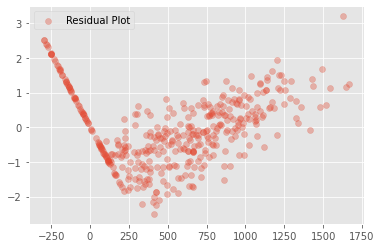

In [47]:
plot_model(X,y)

In [48]:
#observation
y[:5]

1    333
2    903
3    580
4    964
5    331
Name: Balance, dtype: int64

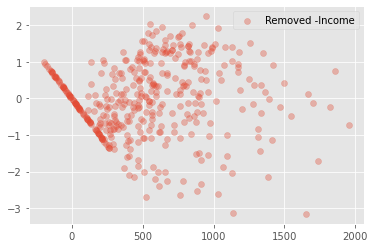

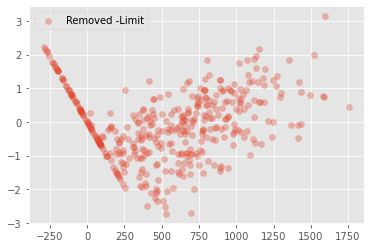

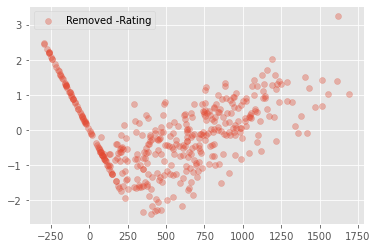

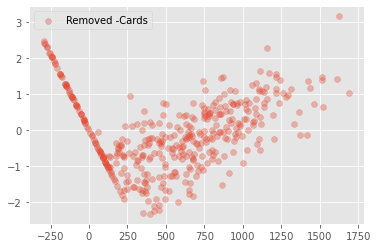

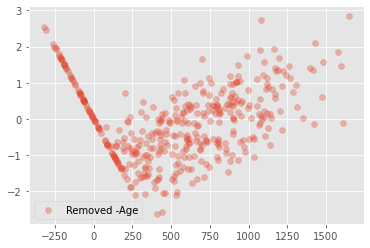

...

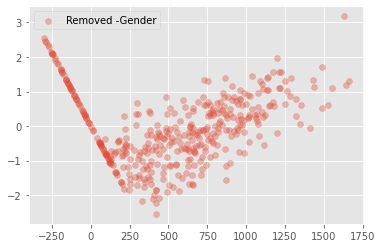

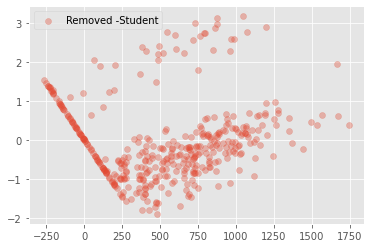

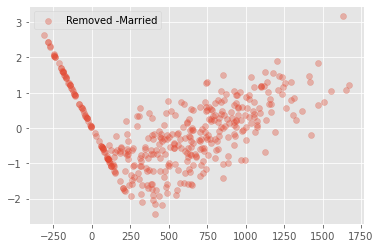

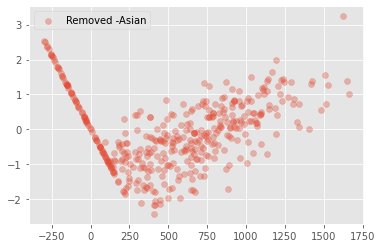

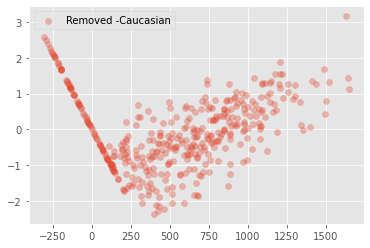

In [49]:
# test other models by excluding some features
all_columns = X.columns
for col_name in all_columns:
    all_columns_copy = list(all_columns)
    all_columns_copy.remove(col_name)
    plot_model(X[all_columns_copy], y, 'Removed -' + str(col_name))

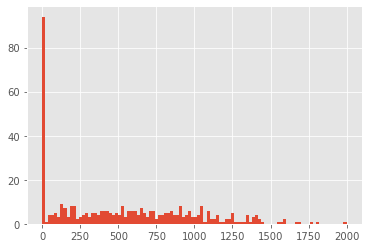

In [50]:
#plotting y (Balance)    there is a large amount of values fitted around 0. This could be affect ing the model. 
y.hist(bins=100)
plt.show()

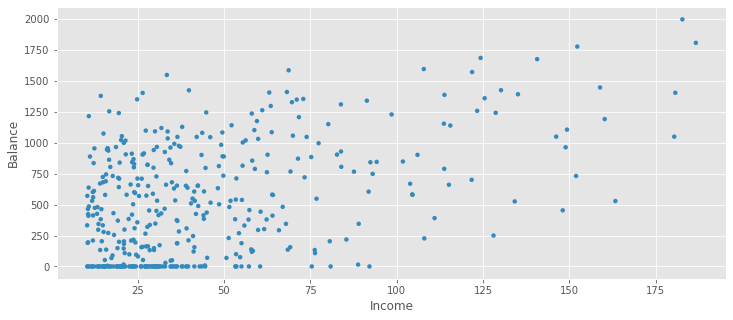

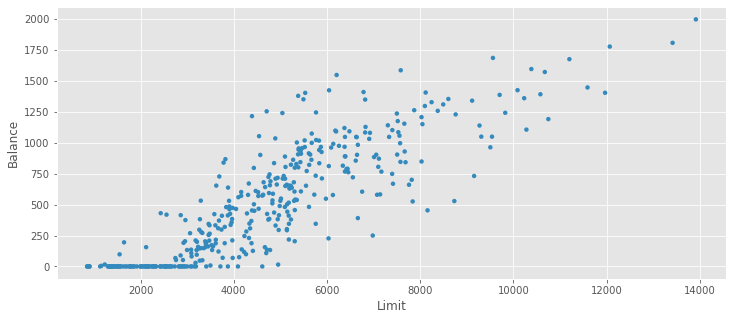

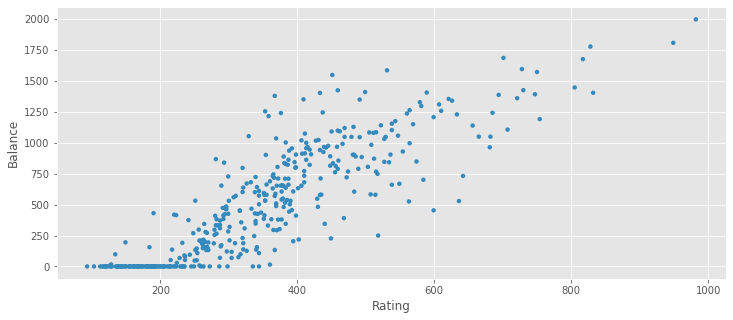

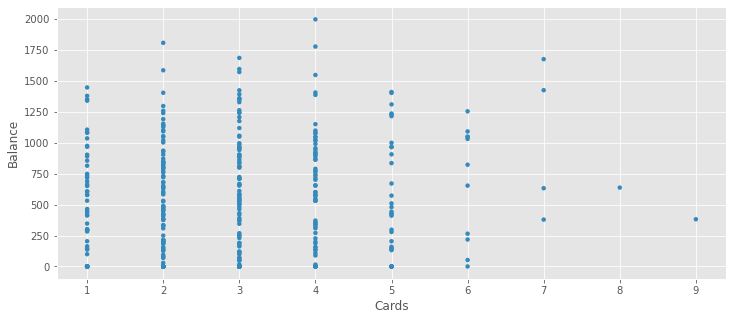

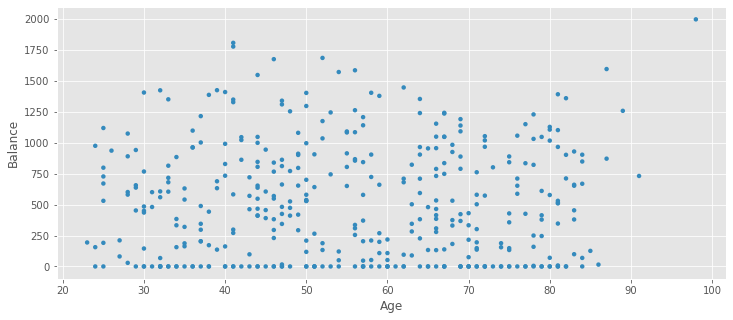

...

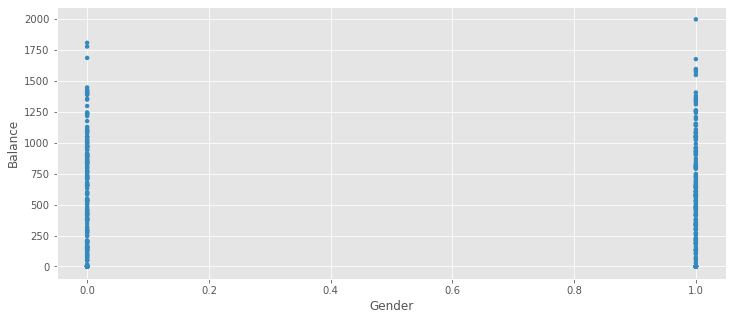

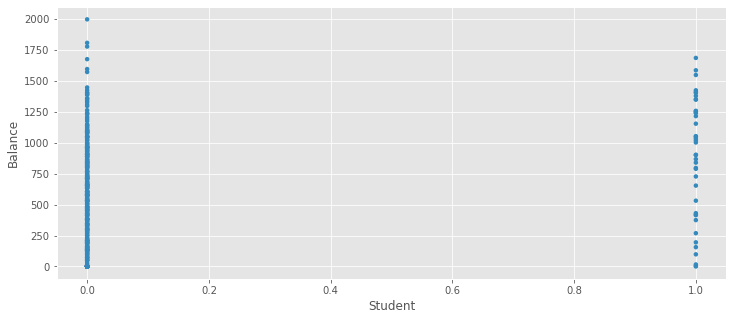

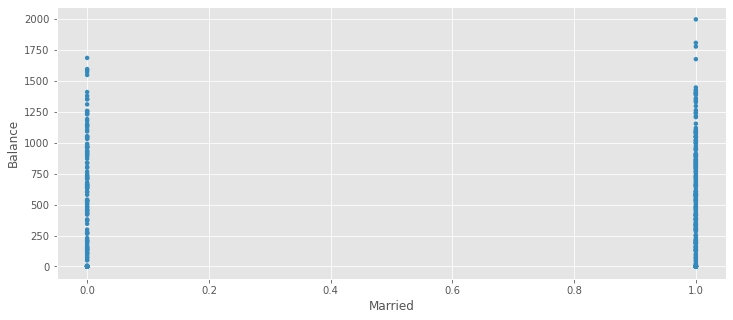

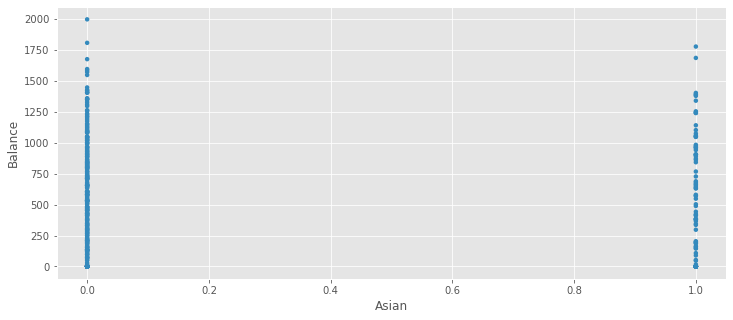

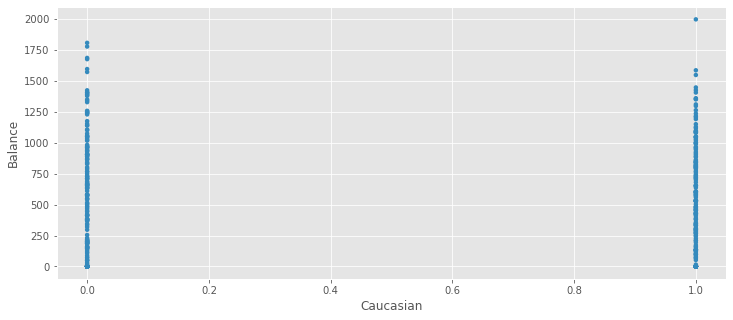

In [51]:
# replot the univariate scatter to look for variables that can differentiate most zero balance observations from non zero observations

for col in all_columns:
    b.plot(kind='scatter', y='Balance', x=col, edgecolor='none', figsize=(12,5))
    plt.xlabel(col)
    plt.ylabel('Balance')
    plt.show()

In [52]:
# after finding relevant variables, decide a reasonable threshold between zero and non-zero observations. (minimize dalse positives and false negatives) Can be done visually or with a Decision Tree.
limit_cond = b['Limit'] >= 3000
new_b = b[limit_cond]

In [53]:
# Separated Balance from all the other predictors
X_new = new_b.copy()
y_new = X_new.pop('Balance')



In [54]:
# Fit a linear regression model to our new X and y
summary_model(X_new, y_new)

# As for everything below 3000 Limit, predict 0

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Balance   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     6081.
Date:                Sun, 20 Jun 2021   Prob (F-statistic):               0.00
Time:                        08:48:50   Log-Likelihood:                -1439.9
No. Observations:                 304   AIC:                             2904.
Df Residuals:                     292   BIC:                             2948.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -663.8842     11.884    -55.862      0.000    -687.274    -640.494
Income        -9.5647      0.075   -127.458      0.000      -9.712      -9.417
Limit          0.3141      0.011     29.559      0.000       0.293       0.335
Rating         0.0473      0.158      0.300      0.764      -0.263       0.358
Cards         25.0709      1.358     18.456      0.000      22.397      27.744
Age           -1.0922      0.096    -11.376      0.000      -1.281      -0.903
Education     -0.0383      0.517     -0.074      0.941      -1.055       0.979
Gender         2.1935      3.245      0.676      0.500      -4.193       8.580
Student      493.8736      5.528     89.347      0.000     482.995     504.753
Married       -3.9065      3.419     -1.142      0.254     -10.636       2.823
Asian          3.7828      4.665      0.811      0.418      -5.398      12.963
Caucasian      0.1146      3.973      0.029      0.977      -7.704       7.934
==============================================================================
Omnibus:                      331.480   Durbin-Watson:                   1.913
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13654.659
Skew:                           4.716   Prob(JB):                         0.00
Kurtosis:                      34.449   Cond. No.                     4.40e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.


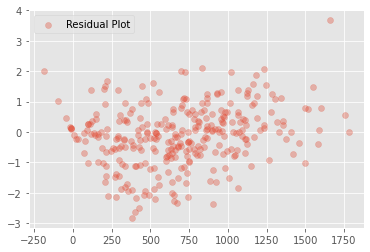

In [55]:
plot_model(X_new, y_new)

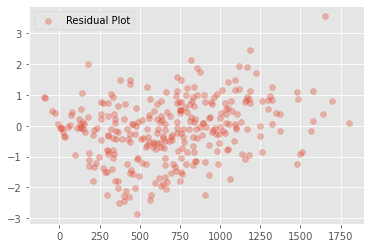

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Balance   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     3602.
Date:                Sun, 20 Jun 2021   Prob (F-statistic):          2.91e-282
Time:                        08:50:05   Log-Likelihood:                -1589.2
No. Observations:                 304   AIC:                             3194.
Df Residuals:                     296   BIC:                             3224.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -579.5257     16.906    -34.279      0.000    -612.797    -546.254
Income        -9.6468      0.122    -79.395      0.000      -9.886      -9.408
Limit          0.3182      0.002    138.639      0.000       0.314       0.323
Age           -0.9911      0.155     -6.377      0.000      -1.297      -0.685
Education     -1.3059      0.827     -1.579      0.115      -2.934       0.322
Student      494.5968      8.859     55.828      0.000     477.162     512.032
Asian          6.9741      7.492      0.931      0.353      -7.771      21.719
Caucasian      0.7491      6.397      0.117      0.907     -11.839      13.338
==============================================================================
Omnibus:                      104.561   Durbin-Watson:                   1.812
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              365.342
Skew:                           1.480   Prob(JB):                     4.64e-80
Kurtosis:                       7.481   Cond. No.                     3.87e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.87e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [58]:
# To decide among the models, you can use adjusted R^2 or F-tests. Tomorrow we'll get into a more general model-evaluation technique called cross-validation.

chosen_columns = ['Income', 'Limit', 'Age', 'Education', 'Student', 'Asian', 'Caucasian']
X_chosen_cols = X_new[chosen_columns]

plot_model(X_chosen_cols, y_new)
summary_model(X_chosen_cols, y_new)

## Computational Complexity and Big-O Notation

In [ ]:

We have a couple important concepts that we want to express mathematically.

First, we don't really care about constant factors. So if a program takes  
n seconds to complete, or 2n, or  100n, we want to treat those as being all the same ( n is rather large), but if it takes  n^2 seconds, that's something else.

Second, we're interested in asymptotic behavior, how a system behaves as  n→∞. For example, if the one part of the program takes  n seconds to run, and the other part takes  0.00001n^2 seconds, eventually, for large enough 
n, the second part will dominate and the whole thing will be proportional to  n^2.




List the benefits of being able to calculte the efficiency of a particular algorithm   
describe the efficeincy of an algorythm,
Count the maximum memory needed by an algorythm,  
estimate how the computer time will grow for larger and larger input.  

     
Use Big-O notation for an given algorithm 



mathematical notation to describe limiting behavior      
Describe what worst, best, and average cases are   

if the element we're looking for is the first one? That's what's called the **best case**;

**average case**, for a typical situation. For the average case above (assuming the element is in the list) we'll have to look at half of the elements before we find it.

We assumed above that we have to look through the entire list to find something, but what if the element we're looking for is the first one? That's what's called the **best case**; if that's true here we can solve the problem in $O(1)$ time.

Knowing the best case isn't that useful, because it doesn't happen very often, and it's not safe to rely on it. A better approach is to look at the **average case**, for a typical situation. For the average case above (assuming the element is in the list) we'll have to look at half of the elements before we find it. We generally care about the average case, because we'll be running our algorithm many times and the average performance matters.

We also need to consider the **worst case**, for a couple reasons. 
- First, even though the worst case might be rare, we still may need to handle it without catastrophic failure. If the worst-case performance will cause our server to crash, we have a problem.

- Second, the worst-case scenario, though rare on random data, might be common on real-world situations. [Quicksort](https://en.wikipedia.org/wiki/Quicksort#Algorithm) (a common sorting algorithms) is $\mathcal O(n \log n)$ complexity on average but $\mathcal O(n^2)$ in the worst case. That might seem ok, except the worst case occurs when the list is already sorted – a fairly common situation. To avoid this it's common to shuffle the list before sorting; or randomely pick the pivot (i.e., not start from either left- or right-most item in the array).


     

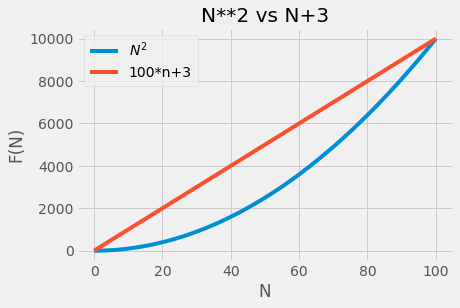

In [63]:
## plot n^2 and n + 3 when n ranges from 0 to 1000
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

x = range(2)
x = np.linspace(0,100,100)
plt.plot(x,[1*n**2 for n in x],label='$N^2$')
plt.plot(x,[100*n+3 for n in x],label = '100*n+3')
plt.legend()
plt.title('N**2 vs N+3')
plt.xlabel('N')
plt.ylabel('F(N)')

plt.show()
#stress asymptotic behavior

In [72]:
def my_sum(lst):
    '''Sum the numbers in a sequence'''
    result = 0
    for x in lst:
        result += x
    return result

In [73]:
# How long should this take

dist = stats.norm(0, 1)


In [74]:
%%timeit lst = dist.rvs(10**3)
my_sum(lst)

183 µs ± 8.42 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [76]:
%%timeit lst = dist.rvs(10**4)
my_sum(lst)

1.8 ms ± 44.2 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [77]:
%%timeit lst = dist.rvs(10**5)
my_sum(lst)

18.1 ms ± 315 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [78]:
%%timeit lst = dist.rvs(10**6)
my_sum(lst)

180 ms ± 3.34 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [80]:
def maxdiff(lst):
    '''find the maximum absolute difference of elements in lst'''
    result = 0
    for i in range(len(lst)):
        for j in range(len(lst)):
            if abs(lst[i] - lst[j]) > result:
                result = abs(lst[i] - lst[j])
    return result

In [81]:
%%timeit lst = dist.rvs(100)
maxdiff(lst)

4.6 ms ± 58.2 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [82]:
%%timeit lst = dist.rvs(200)
maxdiff(lst)

18.2 ms ± 470 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [83]:
%%timeit lst = dist.rvs(400)
maxdiff(lst)

69.1 ms ± 1.7 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [84]:
%%timeit lst = dist.rvs(800)
maxdiff(lst)

288 ms ± 8.99 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


## Regularization

In [ ]:
Ridge regression      
Ridge forces parameters to be small + Ridge is
computationally easier because it is differentiable

Lasso Regression
Lasso tends to set coefficients exactly equal to zero
○ This is useful as a sort-of “automatic feature selection” mechanism,
○ leads to “sparse” models, and
○ serves a similar purpose to stepwise features selection


Note: type depends on the dataset. True sparse models will beefit from Lassso and true dense models will benefit from ridge. 


1)Use regularization!a)Helps prevent overfittingb)Helps with collinearityc)Gives you a knob to adjust bias/variance trade-off2)Don’t forget to standardize your data!a)Column-by-column, de-mean and divide by the standard deviation3)Lambdas control the size (L1 & L2) and existence (L1) of feature coefficients. a)Large lambdas mean more regularization (fewer/smaller coefficients) and less model complexity.4)You can have it all! (ElasticNet)

### Regularization example

In [216]:
#get data
diabetes = load_diabetes() 
# object contains data - has out predictors, features_names - human readable names of features, and target


In [217]:
# create a dataset to examine
X_raw = diabetes.data[:100]
y_raw = diabetes.target[:100]

X = pd.DataFrame(X_raw, columns=diabetes.feature_names)
y = pd.Series(y_raw, index=X.index)

In [211]:
X.head()
# may have to research what the predictors are
# Four of the predictors have human interpretable names. An almost sure guess is that bmi is body mass index, and bp is blood pressure.

# We can confirm this with a quick google search, which reveals this page of documentation.

# The documentation also reveals what the mysterious s1, s2, ... predictors are.

# six blood serum measurements...

# That doesn't mean much without some domain knowledge, but at least we have some awareness of what's going on.
# 
# Finally, the values in this data frame are interesting. In particular, age should take positive integer values, but doesn't, and sex should be a boolean, but is not. Checking out the unique values of sex is revealing:

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019908,-0.017646
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068330,-0.092204
2,0.085299,0.050680,0.044451,-0.005671,-0.045599,-0.034194,-0.032356,-0.002592,0.002864,-0.025930
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022692,-0.009362
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031991,-0.046641


In [116]:
np.unique(X['sex'])
# one must be male and one must be female
# assumption is the data has already been normalized can check by testing means 

array([-0.04464164,  0.05068012])

In [117]:
X.mean()
# all means are zero 

age   -0.009801
sex   -0.004606
bmi   -0.010539
bp    -0.011294
s1    -0.011324
s2    -0.012039
s3     0.009762
s4    -0.013991
s5    -0.010764
s6    -0.012758
dtype: float64

In [98]:
y.head()
# target is a quantitative measure of disease progression one year after baseline

0    151.0
1     75.0
2    141.0
3    206.0
4    135.0
dtype: float64

In [218]:
diabetes_full = X.copy()
diabetes_full['disease_progression'] = y

In [119]:
diabetes_full.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6,disease_progression
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019908,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068330,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005671,-0.045599,-0.034194,-0.032356,-0.002592,0.002864,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022692,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031991,-0.046641,135.0


In [219]:
# check for missing values
diabetes_full.isnull().sum()

age                    0
sex                    0
bmi                    0
bp                     0
s1                     0
s2                     0
s3                     0
s4                     0
s5                     0
s6                     0
disease_progression    0
dtype: int64

In [220]:
#pull out test data
diabetes_train, diabetes_test = train_test_split(diabetes_full, test_size=1/3)
diabetes_train = diabetes_train.copy()
diabetes_test = diabetes_test.copy()

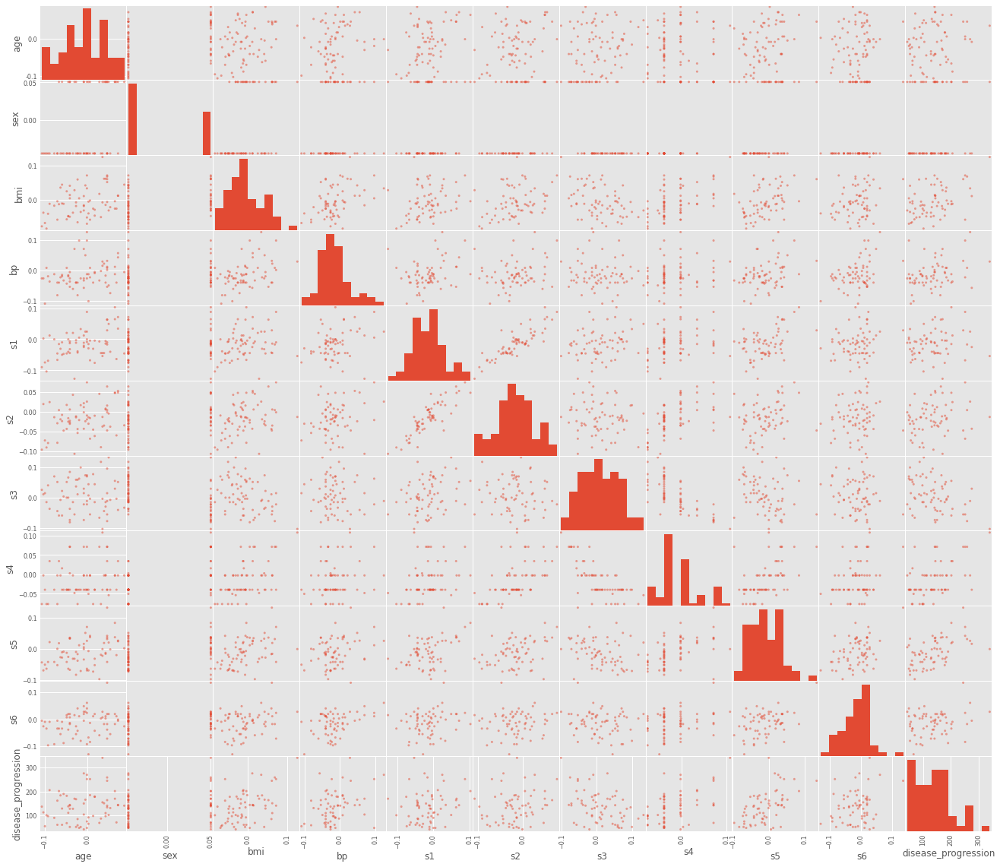

In [221]:
sm = scatter_matrix(diabetes_train, figsize=(20,20))

In [ ]:
# what I should notice: 
# there seemse to be some decent predictors, bmi and bp have good correlation with the target, as do some of the serum measurements
# there also seems to be some strong correlations amongst the predictors themselves, one being S1 and S2, with a more concerning being between bmi and bp


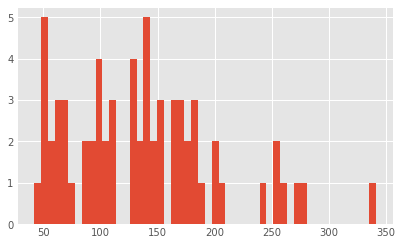

In [223]:
# take a look at target distribution for issues
fig, ax = plt.subplots()
td = ax.hist(diabetes_train['disease_progression'], bins=50)

### Ridge

In [224]:
target_column = 'disease_progression'
X_train, y_train = diabetes_train.drop(target_column, axis=1), diabetes_train[target_column]
X_test= diabetes_test.drop(target_column, axis=1)
y_test = diabetes_test[target_column]

In [225]:
ridge= Ridge(alpha=0.5)
ridge.fit(X_train, y_train)

Ridge(alpha=0.5)

In [226]:
def rss(y, y_hat):
    return np.mean((y - y_hat)**2)

In [227]:
preds = ridge.predict(X_test)
mse = rss(y_test, preds)
print(F'MSE for Ridge(alpha=0.5): {mse:2.2f}')

MSE for Ridge(alpha=0.5): 5069.55


In [228]:
#good fit, now find the sample error usinf ridge regression
def cv(X,y, base_estimator, n_folds):
    kf = KFold(n_splits=n_folds)
    test_cv_errors, train_cv_errors = np.empty(n_folds), np.empty(n_folds)
    for idx, (train, test) in enumerate(kf.split(X_train)):

        # Split into train and test
        X_cv_train, y_cv_train = X[train], y[train]
        X_cv_test, y_cv_test = X[test], y[test]

        # Standardize data.
        standardizer = XyScaler()
        standardizer.fit(X_cv_train, y_cv_train)
        X_cv_train_std, y_cv_train_std = standardizer.transform(X_cv_train, y_cv_train)
        X_cv_test_std, y_cv_test_std = standardizer.transform(X_cv_test, y_cv_test)

        # Fit estimator
        estimator = clone(base_estimator)
        estimator.fit(X_cv_train_std, y_cv_train_std)

        # Measure performance
        y_hat_train = estimator.predict(X_cv_train_std)
        y_hat_test = estimator.predict(X_cv_test_std)

        # Calclate the error metrics
        train_cv_errors[idx] = rss(y_cv_train_std, y_hat_train)
        test_cv_errors[idx] = rss(y_cv_test_std, y_hat_test)

    return train_cv_errors, test_cv_errors

In [229]:
n_folds = 10
train_cv_errors, test_cv_errors = cv(X_train.values, y_train.values, Ridge(alpha=0.5), n_folds= n_folds)

In [230]:
#Now we have arrays of our errors on different folds, and our final CV estimates of the error are the means of these arrays.

print(f'Training CV error: {train_cv_errors.mean():2.2f}')
print(f'Test CV error: {test_cv_errors.mean():2.2f}')

# The training error is lower than the testing error, which is what we should expect.

Training CV error: 0.52
Test CV error: 0.88


In [231]:
# using varying values of alpha
def train_at_various_alphas(X, y, model, alphas, n_folds=10, **kwargs):


    cv_errors_train = pd.DataFrame(np.empty(shape=(n_folds, len(alphas))),
                                     columns=alphas)
    cv_errors_test = pd.DataFrame(np.empty(shape=(n_folds, len(alphas))),
                                        columns=alphas)
    for alpha in alphas:
        train_fold_errors, test_fold_errors = cv(X, y, model(alpha=alpha, **kwargs), n_folds=n_folds)
        cv_errors_train.loc[:, alpha] = train_fold_errors
        cv_errors_test.loc[:, alpha] = test_fold_errors
    return cv_errors_train, cv_errors_test

In [232]:
ridge_alphas = np.logspace(-2, 4, num=250)

ridge_cv_errors_train, ridge_cv_errors_test = train_at_various_alphas(
    X_train.values, y_train.values, Ridge, ridge_alphas)

In [233]:
ridge_cv_errors_train.head()

,0.010000,0.010571,0.011174,0.011811,0.012485,0.013197,0.013950,0.014746,0.015587,0.016477,...,6069.215106,6415.476458,6781.492741,7168.391014,7577.362639,8009.666946,8466.635113,8949.674265,9460.271807,10000.000000
0,0.540587,0.540587,0.540587,0.540587,0.540587,0.540587,0.540587,0.540587,0.540587,0.540587,...,0.976709,0.977906,0.979045,0.980127,0.981157,0.982135,0.983064,0.983946,0.984784,0.985580
1,0.549299,0.549299,0.549299,0.549299,0.549299,0.549299,0.549299,0.549299,0.549300,0.549300,...,0.978424,0.979535,0.980591,0.981595,0.982549,0.983456,0.984318,0.985136,0.985913,0.986650
2,0.514363,0.514363,0.514363,0.514363,0.514363,0.514363,0.514363,0.514363,0.514363,0.514363,...,0.973787,0.975133,0.976413,0.977631,0.978788,0.979888,0.980933,0.981926,0.982869,0.983764
3,0.506424,0.506424,0.506424,0.506424,0.506424,0.506424,0.506424,0.506424,0.506424,0.506424,...,0.974460,0.975771,0.977017,0.978203,0.979331,0.980402,0.981420,0.982387,0.983306,0.984178
4,0.533943,0.533943,0.533943,0.533943,0.533943,0.533943,0.533943,0.533943,0.533943,0.533943,...,0.977442,0.978602,0.979705,0.980754,0.981751,0.982699,0.983599,0.984454,0.985266,0.986037


In [234]:
# Average your ten estimates of training and testing error for each alpha to get a more stable estimate of the training and testing error for each value of the regularization parameter. Compute the value of alpha that leads to the minimum CV test error. 
ridge_mean_cv_errors_train = ridge_cv_errors_train.mean(axis=0)
ridge_mean_cv_errors_test = ridge_cv_errors_test.mean(axis=0)

def get_optimal_alpha(mean_cv_errors_test):
    alphas = mean_cv_errors_test.index
    optimal_idx = np.argmin(mean_cv_errors_test.values)
    optimal_alpha = alphas[optimal_idx]
    return optimal_alpha

ridge_optimal_alpha = get_optimal_alpha(ridge_mean_cv_errors_test)



Text(0, 0.5, 'MSE')

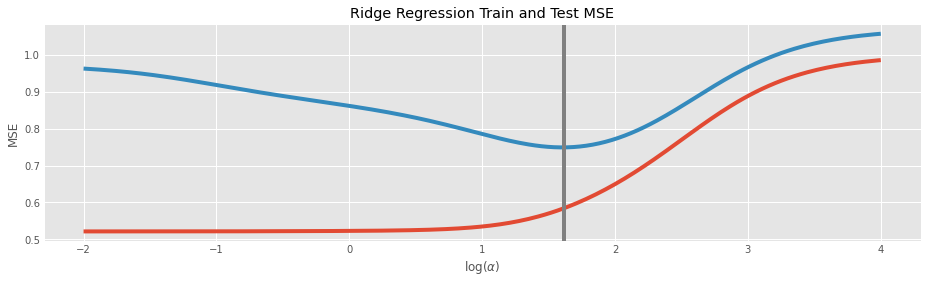

In [235]:
fig, ax = plt.subplots(figsize=(14, 4))

ax.plot(np.log10(ridge_alphas), ridge_mean_cv_errors_train)
ax.plot(np.log10(ridge_alphas), ridge_mean_cv_errors_test)
ax.axvline(np.log10(ridge_optimal_alpha), color='grey')
ax.set_title("Ridge Regression Train and Test MSE")
ax.set_xlabel(r"$\log(\alpha)$")
ax.set_ylabel("MSE")

In [236]:
ridge_models = []

for alpha in ridge_alphas:
    scaler = XyScaler()
    scaler.fit(X_train.values, y_train.values)
    X_train_std, y_train_std = scaler.transform(X_train.values, y_train.values)
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_std, y_train_std)
    ridge_models.append(ridge)

Text(0, 0.5, 'Standardized Coefficient')

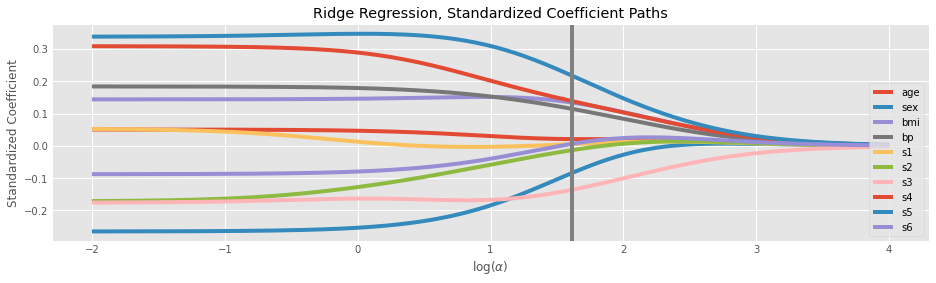

In [237]:
paths = pd.DataFrame(np.empty(shape=(len(ridge_alphas), len(X_train.columns))),
                     index=ridge_alphas, columns=X_train.columns)

for idx, model in enumerate(ridge_models):
    paths.iloc[idx] = model.coef_
    

fig, ax = plt.subplots(figsize=(14, 4))

for column in X_train.columns:
    path = paths.loc[:, column]
    ax.plot(np.log10(ridge_alphas), path, label=column)
ax.axvline(np.log10(ridge_optimal_alpha), color='grey')
ax.legend(loc='lower right')
ax.set_title("Ridge Regression, Standardized Coefficient Paths")
ax.set_xlabel(r"$\log(\alpha)$")
ax.set_ylabel("Standardized Coefficient")

### LASSO

In [241]:
lasso_alphas = np.logspace(-3,1,num=250)

lasso_cv_errors_train, lasso_cv_errors_test = train_at_various_alphas(X_train.values, y_train.values, Lasso, lasso_alphas, max_iter=5000)

In [242]:
lasso_cv_errors_test.shape

(10, 250)

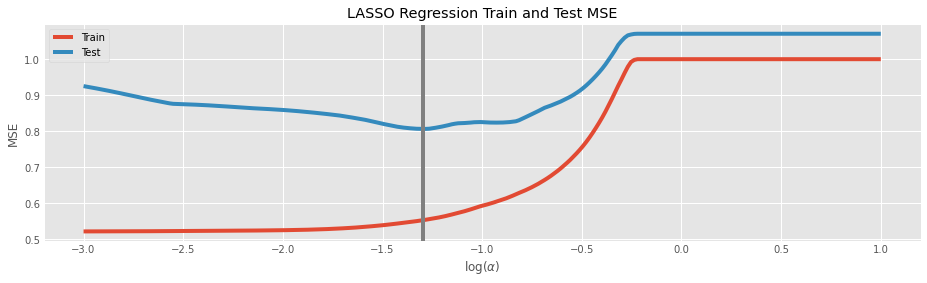

In [249]:
lasso_mean_cv_errors_train = lasso_cv_errors_train.mean(axis=0)
lasso_mean_cv_errors_test = lasso_cv_errors_test.mean(axis=0)

lasso_optimal_alpha = get_optimal_alpha(lasso_mean_cv_errors_test)

fig, ax =plt.subplots(figsize=(14,4))
ax.plot(np.log10(lasso_alphas), lasso_mean_cv_errors_train, label='Train')
ax.plot(np.log10(lasso_alphas), lasso_mean_cv_errors_test, label='Test')
ax.axvline(np.log10(lasso_optimal_alpha), color='grey')
ax.set_title('LASSO Regression Train and Test MSE')
ax.set_xlabel(r'$\log(\alpha)$')
ax.set_ylabel('MSE')
plt.legend(loc='upper left')

In [250]:
lasso_models = []

for alpha in lasso_alphas:
    scaler = XyScaler()
    scaler.fit(X_train.values, y_train.values)
    X_train_std, y_train_std = scaler.transform(X_train.values, y_train.values)
    lasso = Lasso(alpha=alpha)
    lasso.fit(X_train_std, y_train_std)
    lasso_models.append(lasso)

Text(0, 0.5, 'Standardized Coefficient')

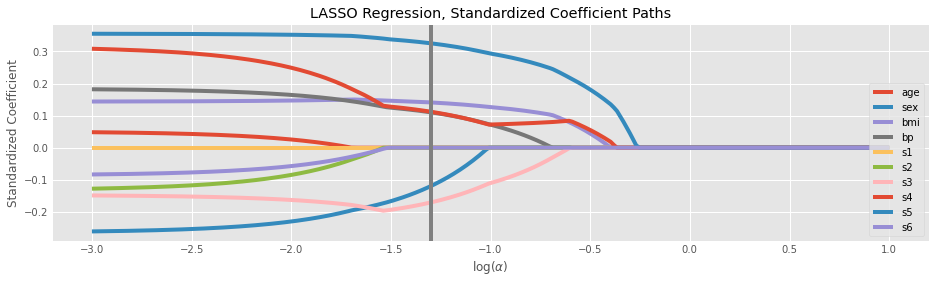

In [251]:
paths = pd.DataFrame(np.empty(shape=(len(lasso_alphas), len(X_train.columns))),
                     index=lasso_alphas, columns=X_train.columns)

for idx, model in enumerate(lasso_models):
    paths.iloc[idx] = model.coef_
    
fig, ax = plt.subplots(figsize=(14, 4))
for column in X_train.columns:
    path = paths.loc[:, column]
    ax.plot(np.log10(lasso_alphas), path, label=column)
ax.axvline(np.log10(lasso_optimal_alpha), color='grey')
ax.legend(loc='lower right')
ax.set_title("LASSO Regression, Standardized Coefficient Paths")
ax.set_xlabel(r"$\log(\alpha)$")
ax.set_ylabel("Standardized Coefficient")

### Compare Models

In [252]:
standardizer = XyScaler()
standardizer.fit(X_train.values, y_train.values)
X_train_std, y_train_std = standardizer.transform(X_train.values, y_train.values)
X_test_std, y_test_std = standardizer.transform(X_test.values, y_test.values)

In [253]:
final_ridge = Ridge(alpha=ridge_optimal_alpha).fit(X_train_std, y_train_std)
final_lasso = Lasso(alpha=lasso_optimal_alpha).fit(X_train_std, y_train_std)
final_lr = LinearRegression().fit(X_train_std, y_train_std)

In [254]:
final_ridge_rss = rss(y_test_std, final_ridge.predict(X_test_std))
final_lasso_rss = rss(y_test_std, final_lasso.predict(X_test_std))
final_lr_rss = rss(y_test_std, final_lr.predict(X_test_std))

In [255]:
print("Final Ridge RSS: {:2.3f}".format(final_ridge_rss))
print("Final Lasso RSS: {:2.3f}".format(final_lasso_rss))
print("Final Linear Regression RSS: {:2.3f}".format(final_lr_rss))

Final Ridge RSS: 0.992
Final Lasso RSS: 0.912
Final Linear Regression RSS: 0.844


## Logistic Regression

In [ ]:
Logistic regression is a classification algorithm. It is used to predict a binary outcome based on a set of independent variables. It is generally the first thing you try when building a classifier, and is used in some production environments. 

Logistic Regression is Supervised Classification -

Supervised: labeled data based on our experience with known data, we want to figure out the result for new data  (also means built from known data)

Classification: what we want to know is a label (category, boolean, text), not a number.     


Advantages:
    Fast (for training and prediction)
    Simple(few hyperparameters)
    Interpretable
    Provide probability

Disadvantages:
    Requires feature engineering to capture non-linear relationships
    doesn't work for p > n




Place logistic regression in the taxonomy of ML algorithms



Explain the key differences and similarities between logistic and linear regression.
Linear regression is used for predicting the continuous dependent variable using a given set of independent features whereas Logistic Regression is used to predict the categorical. Linear regression is used to solve regression problems whereas logistic regression is used to solve classification problems.Linear regression provides a continuous output but Logistic regression provides discreet output.


Fit and interpret a logistic regression model in scikit-learn



Interpret the coefficients of logistic regression, using odds ratio
Probability = ration between positive outcomes and all possible outcomes
probability = wins / (wins + losses)
Odds = ration between positive outcomes and negative outcomes
odds = wins / losses


Drawbacks:
-can be used for multi-class classification 
    ex (Democrat, Republican, Green, Libertatian)
    Depends on a pseudo-ordering of classes
-However, may become unstable
    small changes to the training data may produce relatively large change in predictions
-May not perform well with small n
-May not perform well with unbalanced classes in training data


LDA (Linear Discriminant Analysis)

P(Class|Data) = P(Data|Class) * P(Class) / P(Data)

the probability that a point is in a given class, given the data at that point

the liklihood of the data within class

the prior probability of the class

the probability of the data occuring in all classes

### Logistic Example

In [274]:
df = pd.read_csv('src/grad.csv')
df.head()

,admit,gre,gpa,rank
0,0,380,3.61,3
1,1,660,3.67,3
2,1,800,4.00,1
3,1,640,3.19,4
4,0,520,2.93,4


In [275]:
df.describe()

,admit,gre,gpa,rank
count,400.000000,400.000000,400.000000,400.00000
mean,0.317500,587.700000,3.389900,2.48500
std,0.466087,115.516536,0.380567,0.94446
min,0.000000,220.000000,2.260000,1.00000
25%,0.000000,520.000000,3.130000,2.00000
50%,0.000000,580.000000,3.395000,2.00000
75%,1.000000,660.000000,3.670000,3.00000
max,1.000000,800.000000,4.000000,4.00000


In [277]:
admit=pd.crosstab(df['admit'], df['rank'], rownames=['admit'])
admit
#amount of applicants from each rank that were accepted

rank,1,2,3,4
admit,,,,
0,28,97,93,55
1,33,54,28,12


<AxesSubplot:xlabel='admit'>

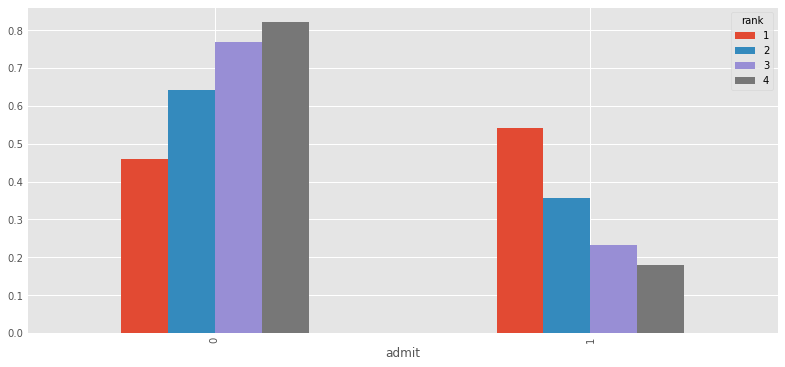

In [278]:
(admit / admit.apply(sum)).plot(kind='bar', figsize=(12,6))

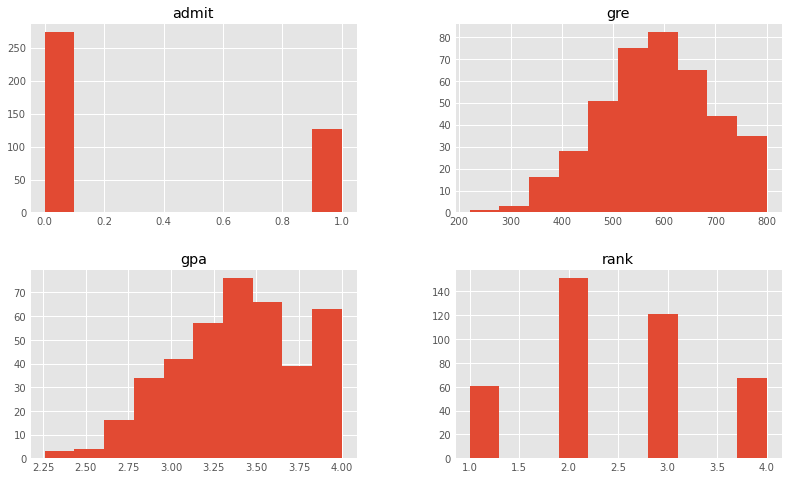

In [282]:
df.hist(figsize=(12, 8));

In [ ]:
note the distribution of GPA and GRE look quite similar, possibly normally distributed slightly skewed to the left(negtive skew) centered around the means of GPA and GRE computed above. And for GPA's there is an anomolous bump near 4.0s.

In [299]:
# check for unbalanced classes

df['admit'].value_counts() /len(df)

0    0.6825
1    0.3175
Name: admit, dtype: float64

In [ ]:

Classes aren't too imbalanced so you should be fine. When dealing with data where the label could potentially be something that is biased one way or the other (such as acceptance, fraud, signups, anything where one label is more preferential to the other or deals with some measure of "success") you should verify. Actually you should most always verify.

In [307]:
X=df[['gre', 'gpa', 'rank']]
y=df['admit']

In [301]:
kfold = KFold(n_splits=10)

accuracies = []
precisions = []
recalls = []

X_train, X_test, y_train, y_test = train_test_split(X,y)

for train_index, test_index in kfold.split(X_train):
    model = LogisticRegression(solver='lbfgs')
    model.fit(X_train.iloc[train_index], y_train.iloc[train_index])
    y_predict = model.predict(X_train.iloc[test_index])
    y_true = y_train.iloc[test_index]
    accuracies.append(accuracy_score(y_true, y_predict))
    precisions.append(precision_score(y_true, y_predict))
    recalls.append(recall_score(y_true, y_predict))

print('Accuracy:', np.average(accuracies))
print('Precision:', np.average(precisions))
print('Recall:', np.average(recalls))

Accuracy: 0.6966666666666665
Precision: 0.5583333333333333
Recall: 0.15348595848595847


In [310]:
# rank is ordinal, change to binary using get_dummies
# dummies = pd.get_dummies(df['rank'], prefix='rank')
# X2 = df[['gre', 'gpa']].join(dummies.loc[:,'rank_2':])
# X2.info()
dummies = pd.get_dummies(df['rank'], prefix='rank')
X2 = df[['gre','gpa']].join(dummies.loc[:,'rank_2':])
X2.head()

,gre,gpa,rank_2,rank_3,rank_4
0,380,3.61,0,1,0
1,660,3.67,0,1,0
2,800,4.00,0,0,0
3,640,3.19,0,0,1
4,520,2.93,0,0,1


In [318]:
# run the numbers again and see if anything changes

accuracies = []
precisions = []
recalls = []

X2_train, X2_test, y_train, y_test = train_test_split(X2, y)

for train_index, test_index in kfold.split(X2_train):
    model = LogisticRegression(solver="lbfgs", max_iter=500)
    model.fit(X2_train.iloc[train_index], y_train.iloc[train_index])
    y_predict = model.predict(X2_train.iloc[test_index])
    y_true = y_train.iloc[test_index]
    accuracies.append(accuracy_score(y_true, y_predict))
    precisions.append(precision_score(y_true, y_predict))
    recalls.append(recall_score(y_true, y_predict))

print('Accuracy:', np.average(accuracies))
print('Precision:', np.average(precisions))
print('Recall:', np.average(recalls))

Accuracy: 0.7033333333333334
Precision: 0.6108333333333333
Recall: 0.26470036499448263


In [322]:
*It seems to perform worse.*

SyntaxError: invalid syntax (<ipython-input-322-936a5bbd65da>, line 1)

In [337]:
# plotting helper function
def simple_plot(ax, x, y, x_label, y_label, title):
    ax.plot(x, y)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(title)

In [344]:
X_train, X_test, y_train, y_test = train_test_split(X, y)
model = LogisticRegression(solver='lbfgs')
model.fit(X_train, y_train)
probabilities = model.predict_proba(X_test)[:, 1]
tpr, fpr, thresholds = roc_curve(probabilities, y_test)

fig, ax = plt.subplots(figsize=(12, 6))

simple_plot(ax, fpr, tpr, 
            "False Positive Rate (1 - Specificity)", 
            "True Positive Rate (Sensitivity, Recall)", 
            "ROC Plot of Admissions Data")

ValueError: Expected 2D array, got 1D array instead:
array=[ 90. 230.  88.  67. 110. 175. 105.  92. 220.  60.  67.  88.  85. 100.
  82. 150. 140.  90.  88.  97.  70. 110.  65. 140.  86.  95. 153.  60.
 208. 105.  68. 150.  86.  70. 150.  75.  80. 150.  90.  88.  90.  87.
  46.  63. 137. 130.  86.  88.  79. 105. 150. 155.  90. 165. 145.  88.
  70.  63. 170.  69.  95. 100. 145. 110. 175.  58.  75. 100.  67.  75.
 110.  95. 105.  78.  90.  71.  68. 175.  84.  90.  85.  98. 150. 150.
 148. 158. 108.  71. 193.  80.  74.  72. 115. 105. 140.  49.  67.  70.
 170.  79. 110. 225.  70. 110. 139.  58. 110. 100.  85.  69. 140.  61.
 180.  78.  84.  60.  94.  85.  81. 113.  54. 110. 150.  95.  63. 170.
  84.  72. 139. 180.  78. 150. 100.  70.  86. 150.  90.  88.  90.  81.
  75. 125. 160.  88.  78.  71. 150. 150. 150. 140. 145.  92. 100. 180.
  96.  52.  68.  72. 150. 165. 105.  75. 175. 100. 145.  70.  67.  71.
 145.  85.  87.  68. 110.  75. 107.  65. 210. 135. 116.  72.  83.  95.
  90.  52.  68.  96.  92.  90. 215.  86.  75. 225.  97.  65.  90. 105.
  62.  72.  92.  83.  70. 152. 130.  89.  80.  70.  64.  67. 120.  88.
 198. 133. 100. 145.  95.  92.  77.  95.  95.  97. 102. 140. 150.  65.
  67.  68.  85. 132.  52.  67. 115.  95.  97.  53. 153. 120. 110. 115.
  97. 110. 170.  80.  69. 105. 145.  83. 150. 175. 100. 100.  60.  97.
  65. 167. 100. 190.  60.  90.  65.  75. 215. 110.  53. 125.  95. 100.
  70. 115. 100. 129. 142.  75. 190.  83. 112.  88. 150.  70. 129. 165.
  75.  76.  66. 225.  65.  48. 150.  90. 138.  75. 150.  90. 100. 110.].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [ ]:
Anscombe's quartet comprises four data sets that have nearly identical simple descriptive statistics, yet have very different distributions and appear very different when graphed. Each dataset consists of eleven (x,y) points. They were constructed in 1973 by the statistician Francis Anscombe to demonstrate both the importance of graphing data before analyzing it and the effect of outliers and other influential observations on statistical properties. He described the article as being intended to counter the impression among statisticians that "numerical calculations are exact, but graphs are rough."[1] It has been rendered as an actual musical quartet.[2]

In [ ]:
variance of the errors is not contstant

## Decision Rules
